# 52 — Training Cellpose on bees via AI lab API

The bees are at different scales ranging from approximately 50 pixels to 300 (on the longer axis).

The bees folder contains some bee labels which you can find here:

    data/bees/labels/input0/     image crops
    data/bees/labels/truth0/     the matching label crops

We will use augmentation to create a larger training set. 

## Imports

First we import the functions we need from ai-lab

In [1]:
from datetime import datetime
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import tifffile
from skimage.io import imread
from tnia.plotting.plt_helper import mask_outline_overlay

from napari_ai_lab.Augmenters.albumentations_augmenter import AlbumentationsAugmenter
from napari_ai_lab.models.image_data_model import ImageDataModel
from napari_ai_lab.Segmenters.GlobalSegmenters.Cellpose3SkopSegmenter import (
    Cellpose3SkopSegmenter,
)
from napari_ai_lab.Segmenters.GlobalSegmenters.Cellpose4SkopSegmenter import (
    Cellpose4SkopSegmenter,
)

plt.rcParams["figure.dpi"] = 72

# 'cellposedino', 'cellposesam' or 'cellpose3'.
# cellposedino is the ViT-B backbone -- about 4 GB to finetune, against 12 for
# the others.
ARCH = "cellposedino"
stamp = datetime.now().strftime("%Y-%m-%d_%H%M")
training_model_name = f"bees_{ARCH}_{stamp}"
print(f"Training model name: {training_model_name}")

SEGMENTER, INITIAL_MODEL, BATCH = {
    "cellposedino": (Cellpose4SkopSegmenter, "cpdino_vitb", 1),
    "cellposesam": (Cellpose4SkopSegmenter, "cpsam_v2", 1),
    "cellpose3": (Cellpose3SkopSegmenter, "cyto3", 8),
}[ARCH]

PROJECT = Path("data/bees").resolve()
PATCH = 256

Training model name: bees_cellposedino_2026-09-25_0815


## Augment

The project has three label crops in `labels/input0` and `labels/truth0`. 

These are the crops taken from the "Label box" ROI, and
`generate_patches_from_labels()` below augments them into the training set.

The full-image annotations drawn in AI Lab are kept separately, in
`data/bees/annotations/Labels (Persistent)/` -- one `.tif` per comb image.

Labels are created from annotations.  The label box is used to mark which areas of the annotation should be made into a label. 
For example you may partially annotate an image and only want to use a sub-region for training (some areas might be a work in progress).
Then you use the label box to signify this. 

The augmenter takes labels and applies transformations to them to create a larger training set.  

In our example we only label 3 regions, and do not capture the entire range of sizes and color of the bees.  However scaling and color augmentations can be used to capture a larger range. 


In [4]:
data_model = ImageDataModel(str(PROJECT))
data_model.delete_patches(axis="yxc")

data_model.set_augmenter(AlbumentationsAugmenter())
data_model.set_patch_size((PATCH, PATCH))
data_model.set_num_patches(50)

patches_dir = data_model.generate_patches_from_labels()

inputs = sorted(Path(patches_dir, "input0").glob("*.tif"))
truths = sorted(Path(patches_dir, "ground_truth0").glob("*.tif"))
print(f"{patches_dir}\n{len(inputs)} patches")

🎨 Generating 50 patches × 3 label crop(s) = 150 total...
Computed global normalization stats: low=0.0000, high=233.0000
  size range: asked for 30-200px long axis, but this image can only reach 608-200px -- shrinking further would need a crop larger than the image
  Generating patches for comb_01_00000.tif (10/150)
  Generating patches for comb_01_00000.tif (20/150)
  Generating patches for comb_01_00000.tif (30/150)
  Generating patches for comb_01_00000.tif (40/150)
  Generating patches for comb_01_00000.tif (50/150)
Computed global normalization stats: low=0.0000, high=233.0000
  size range: asked for 30-200px long axis, but this image can only reach 97-200px -- shrinking further would need a crop larger than the image
  Generating patches for comb_03_00000.tif (60/150)
  Generating patches for comb_03_00000.tif (70/150)
  Generating patches for comb_03_00000.tif (80/150)
  Generating patches for comb_03_00000.tif (90/150)
  Generating patches for comb_03_00000.tif (100/150)
Compute

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].
Clipping input data to the valid range for imshow with RGB dat

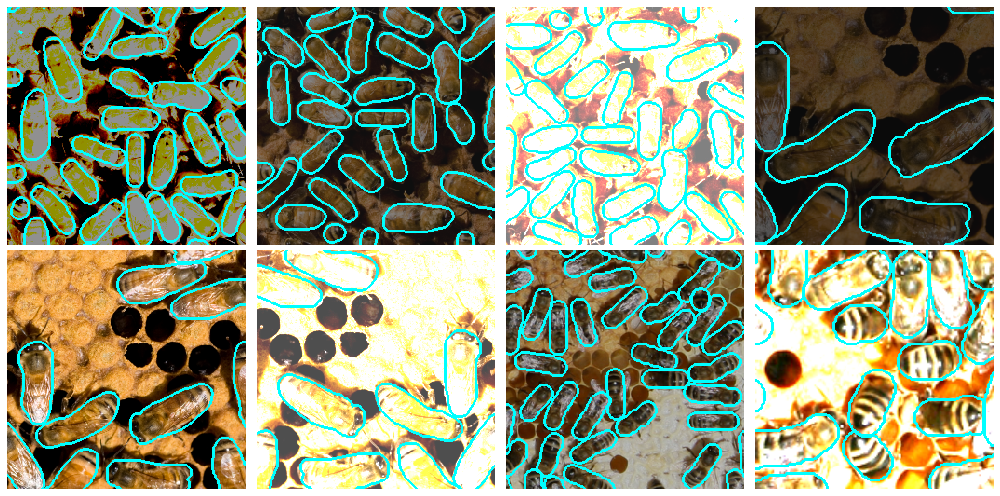

In [5]:
fig, axes = plt.subplots(2, 4, figsize=(14, 7))
step = max(1, len(inputs) // 8)
for ax, im, tr in zip(axes.ravel(), inputs[::step], truths[::step]):
    ax.imshow(mask_outline_overlay(tifffile.imread(im), tifffile.imread(tr)))
for ax in axes.ravel():
    ax.axis("off")
fig.tight_layout()

## Train

In [6]:
segmenter = SEGMENTER()
segmenter.rescale = False
segmenter.num_epochs = 100
segmenter.train_patch_size_xy = PATCH
segmenter.train_batch_size = BATCH
# An epoch is 50 patches, not all of them -- otherwise epoch length
# follows however many patches were generated.
segmenter.nimg_per_epoch = 50

segmenter.patch_path = str(patches_dir)
segmenter.training_model_name = training_model_name 

continue_training = True
if continue_training:
    segmenter.initial_model_name = segmenter.training_model_name
else:
    segmenter.initial_model_name = INITIAL_MODEL

segmenter.model_save_dir = str(PROJECT / "models")

# train() prints nothing without an updater -- it is how the GUI gets progress.
def show(current, maximum, message):
    print(f"{current}/{maximum}  {message}", flush=True)

result = segmenter.train(show)
print(result["message"])

0/100  
0/150  Reading 150 pairs
1/100  
2/100  
3/100  
4/100  
5/100  
6/100  
7/100  
8/100  
9/100  
10/100  
11/100  
12/100  
13/100  
14/100  
15/100  
16/100  
17/100  
18/100  
19/100  
20/100  
21/100  
22/100  
23/100  
24/100  
25/100  
26/100  
27/100  
28/100  
29/100  
30/100  
31/100  
32/100  
33/100  
34/100  
35/100  
36/100  
37/100  
38/100  
39/100  
40/100  
41/100  
42/100  
43/100  
44/100  
45/100  
46/100  
47/100  
48/100  
49/100  
50/100  
51/100  
52/100  
53/100  
54/100  
55/100  
56/100  
57/100  
58/100  
59/100  
60/100  
61/100  
62/100  
63/100  
64/100  
65/100  
66/100  
67/100  
68/100  
69/100  
70/100  
71/100  
72/100  
73/100  
74/100  
75/100  
76/100  
77/100  
78/100  
79/100  
80/100  
81/100  
82/100  
83/100  
84/100  
85/100  
86/100  
87/100  
88/100  
89/100  
90/100  
91/100  
92/100  
93/100  
94/100  
95/100  
96/100  
97/100  
98/100  
99/100  
100/100  
101/100  
102/100  
103/100  
104/100  
105/100  
106/100  
107/100  
108/1

bees_cellposedino_2026-09-25_0815_history.csv: 11 rows, runs ['1'], to epoch 91


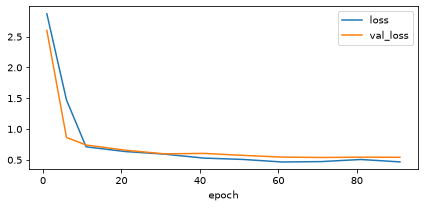

In [7]:
import csv

# The model just trained, not whatever sorts last in the directory.
history_file = next(Path(segmenter.model_save_dir).rglob(
    f"{segmenter.training_model_name}_history.csv"))
with open(history_file) as f:
    history = list(csv.DictReader(f))

epochs = [int(r["epoch"]) for r in history]

fig, ax = plt.subplots(figsize=(6, 3))
ax.plot(epochs, [float(r["loss"]) for r in history], label="loss")
ax.plot(epochs, [float(r["val_loss"]) for r in history], label="val_loss")

# One line per continuation, at the epoch the new run picked up from.
for before, after in zip(history, history[1:]):
    if before["run"] != after["run"]:
        ax.axvline(int(after["epoch"]), color="k", linestyle="--", linewidth=1)
        ax.text(int(after["epoch"]), ax.get_ylim()[1], f' run {after["run"]}',
                va="top", fontsize=8)

ax.set_xlabel("epoch")
ax.legend()
fig.tight_layout()
print(f"{history_file.name}: {len(history)} rows, "
      f"runs {sorted({r['run'] for r in history})}, to epoch {epochs[-1]}")

## Run it on every comb

Seven full images at their own scales, four of which have no labels at all. The
question is whether the model learned bees or learned the three crops it saw.

In [8]:
# train() points inference at the model it just wrote.
print("segmenting with", segmenter.inference_model_name)

results = {}
for path in sorted(PROJECT.glob("comb_*.png")):
    image = imread(path)[..., :3]
    masks = segmenter.segment(image)
    results[path.stem] = (image, masks)
    print(f"{path.stem}: {int(masks.max())} bees")

segmenting with bees_cellposedino_2026-09-25_0815
comb_01: 215 bees
comb_02: 335 bees
comb_03: 52 bees
comb_04: 114 bees
comb_05: 705 bees
comb_06: 1072 bees
comb_07: 1313 bees


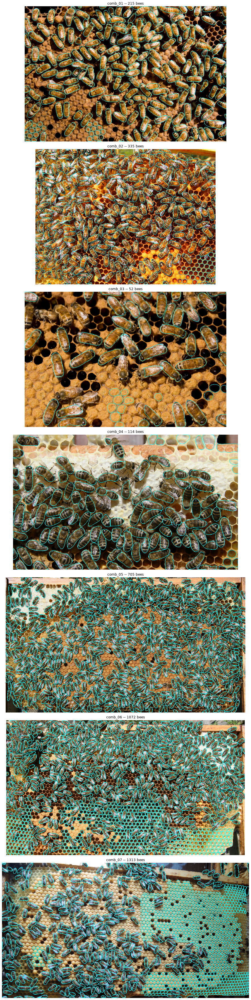

In [9]:
fig, axes = plt.subplots(len(results), 1, figsize=(13, 7 * len(results)))
for ax, (name, (image, masks)) in zip(np.atleast_1d(axes), results.items()):
    ax.imshow(mask_outline_overlay(image, masks))
    ax.set_title(f"{name} -- {int(masks.max())} bees")
    ax.axis("off")
fig.tight_layout()